# 01.01 - PROYECTO KAGGLE

#Descarga y configuración del entorno

In [1]:
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/rramosp/ai4eng.v1/main/content/init.py
import init; init.init(force_download=False); init.get_weblink()

replicating local resources


## Descarga datos directamente desde Kaggle

- create a file `kaggle.json` with your authentication token (in kaggle $\to$ click user icon on top-right $\to$ settings $\to$ API create new token)
- upload it to this notebook workspace
- run the following cell

In [3]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '.'
!chmod 600 ./kaggle.json
!kaggle competitions download -c udea-ai-4-eng-20252-pruebas-saber-pro-colombia

udea-ai-4-eng-20252-pruebas-saber-pro-colombia.zip: Skipping, found more recently modified local copy (use --force to force download)


## Descomprimir e inspeccionar datos

In [4]:
!unzip udea*.zip > /dev/null

In [5]:
!wc *.csv

   296787    296787   4716673 submission_example.csv
   296787   4565553  59185238 test.csv
   692501  10666231 143732437 train.csv
  1286075  15528571 207634348 total


## cargar datos de `train.csv` con pandas



In [6]:
import pandas as pd
import numpy as np

z = pd.read_csv("train.csv")
print ("shape of loaded dataframe", z.shape)


shape of loaded dataframe (692500, 21)


## Carga y exploración inicial de datos

In [7]:
z.head()

,ID,PERIODO_ACADEMICO,E_PRGM_ACADEMICO,E_PRGM_DEPARTAMENTO,E_VALORMATRICULAUNIVERSIDAD,E_HORASSEMANATRABAJA,F_ESTRATOVIVIENDA,F_TIENEINTERNET,F_EDUCACIONPADRE,F_TIENELAVADORA,...,E_PRIVADO_LIBERTAD,E_PAGOMATRICULAPROPIO,F_TIENECOMPUTADOR,F_TIENEINTERNET.1,F_EDUCACIONMADRE,RENDIMIENTO_GLOBAL,INDICADOR_1,INDICADOR_2,INDICADOR_3,INDICADOR_4
0,904256,20212,ENFERMERIA,BOGOTÁ,Entre 5.5 millones y menos de 7 millones,Menos de 10 horas,Estrato 3,Si,Técnica o tecnológica incompleta,Si,...,N,No,Si,Si,Postgrado,medio-alto,0.322,0.208,0.310,0.267
1,645256,20212,DERECHO,ATLANTICO,Entre 2.5 millones y menos de 4 millones,0,Estrato 3,No,Técnica o tecnológica completa,Si,...,N,No,Si,No,Técnica o tecnológica incompleta,bajo,0.311,0.215,0.292,0.264
2,308367,20203,MERCADEO Y PUBLICIDAD,BOGOTÁ,Entre 2.5 millones y menos de 4 millones,Más de 30 horas,Estrato 3,Si,Secundaria (Bachillerato) completa,Si,...,N,No,No,Si,Secundaria (Bachillerato) completa,bajo,0.297,0.214,0.305,0.264
3,470353,20195,ADMINISTRACION DE EMPRESAS,SANTANDER,Entre 4 millones y menos de 5.5 millones,0,Estrato 4,Si,No sabe,Si,...,N,No,Si,Si,Secundaria (Bachillerato) completa,alto,0.485,0.172,0.252,0.190
4,989032,20212,PSICOLOGIA,ANTIOQUIA,Entre 2.5 millones y menos de 4 millones,Entre 21 y 30 horas,Estrato 3,Si,Primaria completa,Si,...,N,No,Si,Si,Primaria completa,medio-bajo,0.316,0.232,0.285,0.294


## Realizaremos un modelo utilizando solo dos columnas.

- Usaremos las columnas.
  - `E_PRGM_ACADEMICO`
  - `F_ESTRATOVIVIENDA`

In [10]:
z = z[['E_PRGM_ACADEMICO', 'F_ESTRATOVIVIENDA', 'RENDIMIENTO_GLOBAL']]
z.head()

,E_PRGM_ACADEMICO,F_ESTRATOVIVIENDA,RENDIMIENTO_GLOBAL
0,ENFERMERIA,Estrato 3,medio-alto
1,DERECHO,Estrato 3,bajo
2,MERCADEO Y PUBLICIDAD,Estrato 3,bajo
3,ADMINISTRACION DE EMPRESAS,Estrato 4,alto
4,PSICOLOGIA,Estrato 3,medio-bajo


<Axes: xlabel='F_ESTRATOVIVIENDA'>

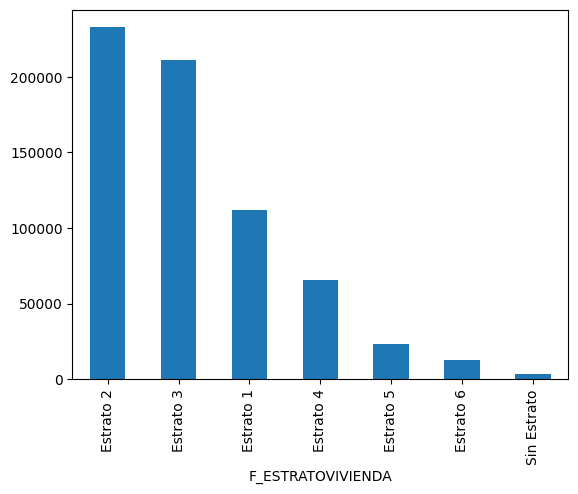

In [11]:
z.F_ESTRATOVIVIENDA.value_counts().plot(kind='bar')

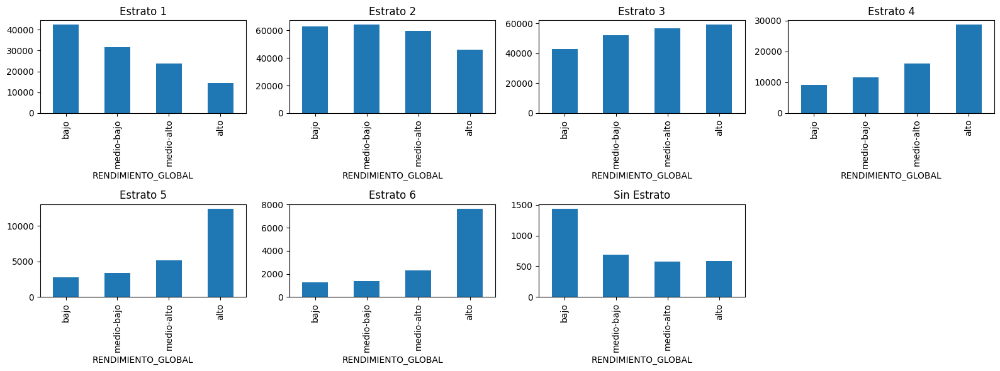

In [12]:
from rlxutils import subplots
import matplotlib.pyplot as plt

c = sorted(z.F_ESTRATOVIVIENDA.value_counts().index)

for ax, ci in subplots(c, n_cols=4, usizex=4):
    zc = z[z.F_ESTRATOVIVIENDA == ci]
    zc.RENDIMIENTO_GLOBAL.value_counts()\
        .reindex(['bajo', 'medio-bajo', 'medio-alto', 'alto'], fill_value=0)\
        .plot(kind='bar', ax=ax)
    ax.set_title(ci)

## Veamos cuales son todos los programas y luego los clasificamos en grupos.

In [13]:
for programa in z['E_PRGM_ACADEMICO'].unique():
    print(programa)


ENFERMERIA
DERECHO
MERCADEO Y PUBLICIDAD
ADMINISTRACION DE EMPRESAS
PSICOLOGIA
MEDICINA VETERINARIA
INGENIERIA MECANICA
ADMINISTRACIÓN EN SALUD OCUPACIONAL
INGENIERIA INDUSTRIAL
ADMINISTRACIÓN FINANCIERA
HOTELERIA Y TURISMO
LICENCIATURA EN CIENCIAS SOCIALES
LICENCIATURA EN PEDAGOGIA INFANTIL
COMUNICACION SOCIAL
CIENCIA POLITICA
PROFESIONAL EN GESTIÓN DE LA SEGURIDAD Y LA SALUD LABORAL
MAESTRO EN MÚSICA
INGENIERIA MECATRONICA
TRABAJO SOCIAL
LICENCIATURA EN BIOLOGIA Y EDUCACION AMBIENTAL
INGENIERIA CIVIL
CONTADURIA PÚBLICA
ADMINISTRACION EN SALUD
ADMINISTRACIÓN DE EMPRESAS
ESTADISTICA
LICENCIATURA EN BIOLOGIA
INGENIERIA AGROINDUSTRIAL
ZOOTECNIA
COMUNICACION AUDIOVISUAL
LICENCIATURA EN EDUCACION BASICA CON ENFASIS EN HUMANIDADES-INGLES
COMUNICACION SOCIAL  - PERIODISMO
SEGURIDAD Y SALUD EN EL TRABAJO
MEDICINA
ADMINISTRACION DE LA SEGURIDAD SOCIAL
CONTADURIA PUBLICA
ODONTOLOGIA
DISEÑO INDUSTRIAL
ECONOMIA
INGENIERIA DE PROCESOS INDUSTRIALES
CONTADURÍA PÚBLICA
INGENIERIA DE SISTEMAS
ARQUITEC

## Si se grafican todos los programas ocupa mucho tiempo y genera muchas graficas por lo que es necesario agruparlos

In [14]:
from rlxutils import subplots
import matplotlib.pyplot as plt

c = sorted(z.E_PRGM_ACADEMICO.value_counts().index)

for ax, ci in subplots(c, n_cols=4, usizex=4):
    zc = z[z.E_PRGM_ACADEMICO == ci]
    zc.RENDIMIENTO_GLOBAL.value_counts()\
        .reindex(['bajo', 'medio-bajo', 'medio-alto', 'alto'], fill_value=0)\
        .plot(kind='bar', ax=ax)
    ax.set_title(ci)


### Limpieza `E_PRGM_ACADEMICO`

  Observe que para `E_PRGM_ACADEMICO` no hay datos faltantes, esto pudo deberse a que es obligación decir el programa academico cuando se presenta la prueba.

  De todas maneras vamos hacer una limpieza y a normalizar los programas.


In [15]:
!pip install unidecode
import unidecode

df = pd.read_csv("train.csv")
df['E_PRGM_ACADEMICO'] = df['E_PRGM_ACADEMICO'].str.upper().apply(lambda x: unidecode.unidecode(x.strip()))

categorias = {
    "INGENIERIA": ["INGENIERIA", "TECNOLOGIA", "ING"],
    "SALUD": ["ENFERMERIA", "MEDICINA", "VETERINARIA", "PSICOLOGIA", "ODONTOLOGIA", "SALUD"],
    "ADMINISTRACION": ["ADMINISTRACION", "FINANCIERA", "NEGOCIOS", "GERENCIA"],
    "DERECHO": ["DERECHO", "LEY"],
    "MERCADOTECNIA": ["MERCADEO", "PUBLICIDAD", "MARKETING"],
}

def clasificar_programa(nombre):
    for categoria, claves in categorias.items():
        for clave in claves:
            if clave in nombre:
                return categoria
    palabras = nombre.split()
    max_matches = 0
    mejor_categoria = None
    for categoria, claves in categorias.items():
        matches = sum(1 for palabra in palabras if any(clave in palabra for clave in claves))
        if matches > max_matches:
            max_matches = matches
            mejor_categoria = categoria
    return mejor_categoria if mejor_categoria else list(categorias.keys())[0]  # Siempre devuelve algo


df["CLASIFICACION"] = df["E_PRGM_ACADEMICO"].apply(clasificar_programa)
df.to_csv("train_clasificado.csv", index=False)

print(df[["E_PRGM_ACADEMICO", "CLASIFICACION"]].head(10))
print("Número de programas sin clasificar:", df["CLASIFICACION"].isna().sum())


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.8/235.8 kB 4.6 MB/s eta 0:00:00
                      E_PRGM_ACADEMICO   CLASIFICACION
0                           ENFERMERIA           SALUD
1                              DERECHO         DERECHO
2                MERCADEO Y PUBLICIDAD   MERCADOTECNIA
3           ADMINISTRACION DE EMPRESAS  ADMINISTRACION
4                           PSICOLOGIA           SALUD
5                 MEDICINA VETERINARIA           SALUD
6                  INGENIERIA MECANICA      INGENIERIA
7  ADMINISTRACION EN SALUD OCUPACIONAL           SALUD
8                INGENIERIA INDUSTRIAL      INGENIERIA
9           ADMINISTRACION DE EMPRESAS  ADMINISTRACION
Número de programas sin clasificar: 0


## Se grafica el número de estudiantes por categoria, esto permite trabajar de una mejor manera en el modelo.

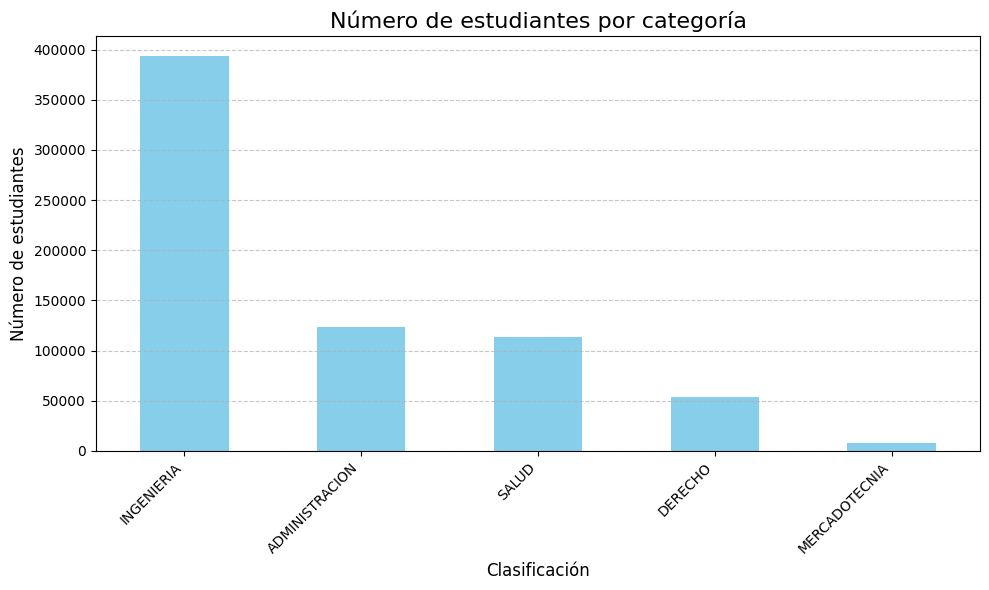

Total de estudiantes: 692500


In [16]:
import matplotlib.pyplot as plt
estudiantes_por_categoria = df.groupby("CLASIFICACION")["ID"].count().sort_values(ascending=False)
plt.figure(figsize=(10,6))
estudiantes_por_categoria.plot(kind='bar', color='skyblue')
plt.title('Número de estudiantes por categoría', fontsize=16)
plt.xlabel('Clasificación', fontsize=12)
plt.ylabel('Número de estudiantes', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

total_estudiantes = estudiantes_por_categoria.sum()
print("Total de estudiantes:", total_estudiantes)


In [17]:
import pandas as pd

# Calcular conteo por categoría
conteo = df["CLASIFICACION"].value_counts().reset_index()
conteo.columns = ["Categoria", "Numero_de_estudiantes"]

# Total de estudiantes
total = conteo["Numero_de_estudiantes"].sum()

# Calcular porcentaje
conteo["Porcentaje"] = (conteo["Numero_de_estudiantes"] / total).round(2)

# Mostrar resultados
print("Total de estudiantes:", total)
print(conteo)


Total de estudiantes: 692500
        Categoria  Numero_de_estudiantes  Porcentaje
0      INGENIERIA                 393994        0.57
1  ADMINISTRACION                 124051        0.18
2           SALUD                 113137        0.16
3         DERECHO                  53840        0.08
4   MERCADOTECNIA                   7478        0.01


In [18]:
df["CLASIFICACION"] = df["CLASIFICACION"].astype(str).str.strip().str.upper()

df["CLASIFICACION_CONTINUA"] = df["CLASIFICACION"].replace({
    "INGENIERIA": 0.569,
    "ADMINISTRACION": 0.179,
    "SALUD": 0.163,
    "DERECHO": 0.078,
    "MERCADOTECNIA": 0.011,
    "NO INFO": -1,
    "NO APLICA": -1,
    "NO SABE": -1
})

df["CLASIFICACION_CONTINUA"] = pd.to_numeric(df["CLASIFICACION_CONTINUA"], errors="coerce").fillna(-1)
print(df["CLASIFICACION_CONTINUA"].value_counts())


CLASIFICACION_CONTINUA
0.569    393994
0.179    124051
0.163    113137
0.078     53840
0.011      7478
Name: count, dtype: int64


/tmp/ipython-input-1636982582.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["CLASIFICACION_CONTINUA"] = df["CLASIFICACION"].replace({


### Limpieza `F_ESTRATOVIVIENDA`

Convertimos `F_ESTRATOVIVIENDA` a un valor **continuo** ya que el ordenamiento tiene sentido y nos gustaría que los modelos tuvieran la oportunidad de capturarlo.

Observe que asignamos `sin información` a -1, lo cual es algo artificial en este caso.

In [19]:
z.loc[z.F_ESTRATOVIVIENDA.isna(), 'F_ESTRATOVIVIENDA'] = 'no info'
z.loc[z.E_PRGM_ACADEMICO.isna(), 'E_PRGM_ACADEMICO'] = 'no info'


In [20]:
z["F_ESTRATOVIVIENDA"] = z["F_ESTRATOVIVIENDA"].astype(str).str.strip().str.title()

z["F_ESTRATOVIVIENDA"] = z["F_ESTRATOVIVIENDA"].replace({
    'Estrato 1': 1,
    'Estrato 2': 2,
    'Estrato 3': 3,
    'Estrato 4': 4,
    'Estrato 5': 5,
    'Estrato 6': 6,
    'Sin Estrato': 0,
    'No Info': -1,
    'No Aplica': -1,
    'No Sabe': -1
})

z["F_ESTRATOVIVIENDA"] = pd.to_numeric(z["F_ESTRATOVIVIENDA"], errors="coerce").fillna(-1).astype(int)
print(z["F_ESTRATOVIVIENDA"].value_counts())


F_ESTRATOVIVIENDA
 2    232671
 3    210685
 1    111991
 4     65514
-1     32137
 5     23608
 6     12605
 0      3289
Name: count, dtype: int64


/tmp/ipython-input-3159508231.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  z["F_ESTRATOVIVIENDA"] = z["F_ESTRATOVIVIENDA"].replace({


## Verificamos que las columna con las que vamos a trabajar esten limpias


In [21]:
sum(z.E_PRGM_ACADEMICO.isna()), sum(z.F_ESTRATOVIVIENDA.isna())

(0, 0)

# **Entrega 02_preprocesado**

In [26]:
# ==============================================================
# 1. IMPORTAR LIBRERÍAS Y CONFIGURAR ENTORNO
# ==============================================================

import os, sys, warnings, importlib.util, subprocess
warnings.filterwarnings("ignore")

for m in ("numexpr", "bottleneck"):
    sys.modules.pop(m, None)
os.environ["PANDAS_NO_IMPORT_NUMEXPR"] = "1"
os.environ["PANDAS_NO_IMPORT_BOTTLENECK"] = "1"

def ensure(pkgs):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-U", *pkgs])

try:
    import pandas as pd
    import numpy as np
    import sklearn
except:
    ensure(["pandas>=2.2.2", "scikit-learn>=1.4.2", "joblib"])

import pandas as pd, numpy as np, sklearn
pd.set_option("compute.use_numexpr", False)
pd.set_option("compute.use_bottleneck", False)

print(f"numpy: {np.__version__} | pandas: {pd.__version__} | sklearn: {sklearn.__version__}")


numpy: 2.0.2 | pandas: 2.2.2 | sklearn: 1.6.1


In [27]:
# ==============================================================
# 2. CARGA DE DATOS LIMPIOS
# ==============================================================

DATA_PATH = "train.csv"
assert os.path.exists(DATA_PATH), f"No se encontró {DATA_PATH}"

df = pd.read_csv(DATA_PATH)
print("Shape:", df.shape)
df.head()


Shape: (692500, 21)


,ID,PERIODO_ACADEMICO,E_PRGM_ACADEMICO,E_PRGM_DEPARTAMENTO,E_VALORMATRICULAUNIVERSIDAD,E_HORASSEMANATRABAJA,F_ESTRATOVIVIENDA,F_TIENEINTERNET,F_EDUCACIONPADRE,F_TIENELAVADORA,...,E_PRIVADO_LIBERTAD,E_PAGOMATRICULAPROPIO,F_TIENECOMPUTADOR,F_TIENEINTERNET.1,F_EDUCACIONMADRE,RENDIMIENTO_GLOBAL,INDICADOR_1,INDICADOR_2,INDICADOR_3,INDICADOR_4
0,904256,20212,ENFERMERIA,BOGOTÁ,Entre 5.5 millones y menos de 7 millones,Menos de 10 horas,Estrato 3,Si,Técnica o tecnológica incompleta,Si,...,N,No,Si,Si,Postgrado,medio-alto,0.322,0.208,0.310,0.267
1,645256,20212,DERECHO,ATLANTICO,Entre 2.5 millones y menos de 4 millones,0,Estrato 3,No,Técnica o tecnológica completa,Si,...,N,No,Si,No,Técnica o tecnológica incompleta,bajo,0.311,0.215,0.292,0.264
2,308367,20203,MERCADEO Y PUBLICIDAD,BOGOTÁ,Entre 2.5 millones y menos de 4 millones,Más de 30 horas,Estrato 3,Si,Secundaria (Bachillerato) completa,Si,...,N,No,No,Si,Secundaria (Bachillerato) completa,bajo,0.297,0.214,0.305,0.264
3,470353,20195,ADMINISTRACION DE EMPRESAS,SANTANDER,Entre 4 millones y menos de 5.5 millones,0,Estrato 4,Si,No sabe,Si,...,N,No,Si,Si,Secundaria (Bachillerato) completa,alto,0.485,0.172,0.252,0.190
4,989032,20212,PSICOLOGIA,ANTIOQUIA,Entre 2.5 millones y menos de 4 millones,Entre 21 y 30 horas,Estrato 3,Si,Primaria completa,Si,...,N,No,Si,Si,Primaria completa,medio-bajo,0.316,0.232,0.285,0.294


In [57]:
# ==============================================================
# 2.1 LIMPIEZA Y AGRUPACIÓN DE PROGRAMAS ACADÉMICOS
# ==============================================================

!pip install -q unidecode
import unidecode

# Normalizar texto
df["E_PRGM_ACADEMICO"] = (
    df["E_PRGM_ACADEMICO"]
    .astype(str)
    .str.upper()
    .apply(lambda x: unidecode.unidecode(x.strip()))
)

# Diccionario de agrupación
categorias = {
    "INGENIERIA": ["INGENIERIA", "TECNOLOGIA", "ING"],
    "SALUD": ["ENFERMERIA", "MEDICINA", "VETERINARIA", "PSICOLOGIA", "ODONTOLOGIA", "SALUD"],
    "ADMINISTRACION": ["ADMINISTRACION", "FINANCIERA", "NEGOCIOS", "GERENCIA"],
    "DERECHO": ["DERECHO", "LEY"],
    "MERCADOTECNIA": ["MERCADO", "PUBLICIDAD", "MARKETING"],
}

def clasificar_programa(nombre):
    for categoria, claves in categorias.items():
        for clave in claves:
            if clave in nombre:
                return categoria
    return "NO_CLASIFICADO"

# Crear columna clasificada
df["CLASIFICACION"] = df["E_PRGM_ACADEMICO"].apply(clasificar_programa)

print("Vista previa de clasificación de programas:")
display(df[["E_PRGM_ACADEMICO", "CLASIFICACION"]].head(10))



Vista previa de clasificación de programas:


,E_PRGM_ACADEMICO,CLASIFICACION
0,ENFERMERIA,SALUD
1,DERECHO,DERECHO
2,MERCADEO Y PUBLICIDAD,MERCADOTECNIA
3,ADMINISTRACION DE EMPRESAS,ADMINISTRACION
4,PSICOLOGIA,SALUD
5,MEDICINA VETERINARIA,SALUD
6,INGENIERIA MECANICA,INGENIERIA
7,ADMINISTRACION EN SALUD OCUPACIONAL,SALUD
8,INGENIERIA INDUSTRIAL,INGENIERIA
9,ADMINISTRACION DE EMPRESAS,ADMINISTRACION


In [47]:
# ==============================================================
# 3. VARIABLES CLAVE
# ==============================================================

TARGET = "RENDIMIENTO_GLOBAL"
features = ["E_PRGM_ACADEMICO", "F_ESTRATOVIVIENDA"]

# Se crea subconjunto solo con las variables seleccionadas
df = df[features + [TARGET]].copy()
print("Variables seleccionadas:", features, "| Objetivo:", TARGET)
df.head()


Variables seleccionadas: ['E_PRGM_ACADEMICO', 'F_ESTRATOVIVIENDA'] | Objetivo: RENDIMIENTO_GLOBAL


,E_PRGM_ACADEMICO,F_ESTRATOVIVIENDA,RENDIMIENTO_GLOBAL
0,ENFERMERIA,Estrato 3,medio-alto
1,DERECHO,Estrato 3,bajo
2,MERCADEO Y PUBLICIDAD,Estrato 3,bajo
3,ADMINISTRACION DE EMPRESAS,Estrato 4,alto
4,PSICOLOGIA,Estrato 3,medio-bajo


In [48]:
# ==============================================================
# 4. SEPARACIÓN TRAIN / VALID
# ==============================================================

from sklearn.model_selection import train_test_split

X = df[features]
y = df[TARGET]

x_train, x_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("X_train:", x_train.shape, "| X_valid:", x_valid.shape)


X_train: (554000, 2) | X_valid: (138500, 2)


In [49]:
# ==============================================================
# 5. LIMPIEZA DE DATOS
# ==============================================================

# Estandarizamos texto y manejamos faltantes
for c in ["E_PRGM_ACADEMICO", "F_ESTRATOVIVIENDA"]:
    x_train[c] = x_train[c].astype(str).str.strip().str.upper()
    x_valid[c] = x_valid[c].astype(str).str.strip().str.upper()
    x_train[c].replace(["NAN", "NONE", "NO INFO"], np.nan, inplace=True)
    x_valid[c].replace(["NAN", "NONE", "NO INFO"], np.nan, inplace=True)

print("Valores faltantes por columna en entrenamiento:\n", x_train.isna().sum())


Valores faltantes por columna en entrenamiento:
 E_PRGM_ACADEMICO         0
F_ESTRATOVIVIENDA    25666
dtype: int64


In [50]:
# ==============================================================
# 6. PIPELINES DE PREPROCESADO
# ==============================================================

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Todas las columnas son categóricas
cat_cols = features

cat_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=True))
])

preprocessor = ColumnTransformer([
    ("cat", cat_pipeline, cat_cols)
])

print("Pipeline configurado correctamente.")


Pipeline configurado correctamente.


In [51]:
# ==============================================================
# 7. AJUSTAR Y TRANSFORMAR DATOS
# ==============================================================

Xt_train = preprocessor.fit_transform(x_train)
Xt_valid = preprocessor.transform(x_valid)

from scipy import sparse

def info_matrix(X, name):
    if sparse.issparse(X):
        dens = X.nnz / (X.shape[0] * X.shape[1])
        print(f"{name}: SPARSE {X.shape}, densidad={dens:.5f}")
    else:
        print(f"{name}: DENSE {X.shape}")

info_matrix(Xt_train, "Xt_train")
info_matrix(Xt_valid, "Xt_valid")


Xt_train: SPARSE (554000, 791), densidad=0.00253
Xt_valid: SPARSE (138500, 791), densidad=0.00253


In [52]:
# ==============================================================
# 8. GUARDAR PIPELINE
# ==============================================================

import joblib
OUT_PIPE = "preprocesador.pkl"
joblib.dump(preprocessor, OUT_PIPE)
print(f"Guardado pipeline en {OUT_PIPE}")


Guardado pipeline en preprocesador.pkl


In [53]:
# ==============================================================
# 9. VALIDACIÓN RÁPIDA CON MODELO BASE
# ==============================================================

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

base_model = LogisticRegression(max_iter=1000)
base_model.fit(Xt_train, y_train)

y_pred = base_model.predict(Xt_valid)
acc = accuracy_score(y_valid, y_pred)
print(f"Accuracy validación: {acc:.4f}")
print("\n=== Reporte de Clasificación ===")
print(classification_report(y_valid, y_pred))


Accuracy validación: 0.3856

=== Reporte de Clasificación ===
              precision    recall  f1-score   support

        alto       0.46      0.60      0.52     35124
        bajo       0.41      0.50      0.45     34597
  medio-alto       0.29      0.22      0.25     34324
  medio-bajo       0.31      0.21      0.25     34455

    accuracy                           0.39    138500
   macro avg       0.37      0.38      0.37    138500
weighted avg       0.37      0.39      0.37    138500



In [61]:
# ==============================================================
# 10. EXPORTAR DATOS PREPROCESADOS Y ARTEFACTOS
# ==============================================================
# Este bloque crea el dataset consolidado (Estrato, Clasificación, Rendimiento)
# y guarda también las matrices y el modelo base.
# ==============================================================

import os
import pandas as pd
import joblib
from scipy import sparse

# --- Normalizar texto de las columnas principales ---
def limpiar_texto(x):
    if isinstance(x, str):
        return (
            x.strip()
            .upper()
            .replace("Á", "A")
            .replace("É", "E")
            .replace("Í", "I")
            .replace("Ó", "O")
            .replace("Ú", "U")
        )
    return x

# ==============================================================
# 1️⃣ Consolidar dataset final con columnas relevantes
# ==============================================================
try:
    df_final = df.copy()
    df_final["F_ESTRATOVIVIENDA"] = df_final["F_ESTRATOVIVIENDA"].apply(limpiar_texto)
    df_final["RENDIMIENTO_GLOBAL"] = df_final["RENDIMIENTO_GLOBAL"].apply(limpiar_texto)
    df_final["CLASIFICACION"] = df_final["CLASIFICACION"].apply(limpiar_texto)

    # Eliminar filas sin datos válidos
    df_final = df_final.dropna(subset=["F_ESTRATOVIVIENDA", "CLASIFICACION", "RENDIMIENTO_GLOBAL"])

    # Dejar solo las columnas consolidadas
    df_final = df_final[["F_ESTRATOVIVIENDA", "CLASIFICACION", "RENDIMIENTO_GLOBAL"]]

    print(f"✅ Dataset consolidado correctamente: {len(df_final)} filas")
    display(df_final.head(10))
except Exception as e:
    print("⚠️ Error al generar df_final:", e)


# ==============================================================
# 2️⃣ Exportar dataset y artefactos del preprocesamiento
# ==============================================================
os.makedirs("models", exist_ok=True)
os.makedirs("data/processed", exist_ok=True)

# Guardar dataset preprocesado principal
df_final.to_csv("data/processed/train_preprocesado.csv", index=False, encoding="utf-8-sig")

# Guardar modelo base
joblib.dump(base_model, "models/baseline_logreg.pkl")

# Guardar matrices procesadas
sparse.save_npz("data/processed/Xt_train.npz", Xt_train)
sparse.save_npz("data/processed/Xt_valid.npz", Xt_valid)
y_train.to_csv("data/processed/y_train.csv", index=False)
y_valid.to_csv("data/processed/y_valid.csv", index=False)

print("\n📁 Archivos exportados en carpeta data/processed/:")
print(" - train_preprocesado.csv")
print(" - Xt_train.npz / Xt_valid.npz")
print(" - y_train.csv / y_valid.csv")
print("\n📁 Modelo guardado en carpeta models/: baseline_logreg.pkl")
print("\nExportación completada con éxito.")



✅ Dataset consolidado correctamente: 660363 filas


,F_ESTRATOVIVIENDA,CLASIFICACION,RENDIMIENTO_GLOBAL
0,ESTRATO 3,SALUD,MEDIO-ALTO
1,ESTRATO 3,DERECHO,BAJO
2,ESTRATO 3,MERCADOTECNIA,BAJO
3,ESTRATO 4,ADMINISTRACION,ALTO
4,ESTRATO 3,SALUD,MEDIO-BAJO
5,ESTRATO 5,SALUD,MEDIO-ALTO
6,ESTRATO 2,INGENIERIA,ALTO
7,ESTRATO 2,SALUD,MEDIO-BAJO
8,ESTRATO 1,INGENIERIA,MEDIO-BAJO
9,ESTRATO 5,ADMINISTRACION,ALTO



📁 Archivos exportados en carpeta data/processed/:
 - train_preprocesado.csv
 - Xt_train.npz / Xt_valid.npz
 - y_train.csv / y_valid.csv

📁 Modelo guardado en carpeta models/: baseline_logreg.pkl

Exportación completada con éxito.


In [62]:
# ==============================================================
# 11. FUNCIÓN DE SUBMISIÓN Y DRY RUN
# ==============================================================

import pandas as pd

def make_submission(
    path_test="test.csv",
    path_sample="submission_example.csv",
    path_pipeline="preprocesador.pkl",
    path_model="models/baseline_logreg.pkl",
    out_path="submission_baseline.csv",
    id_col="ID"
):
    """Genera archivo CSV con el mismo formato del sample."""
    assert os.path.exists(path_test), f"no existe {path_test}"
    assert os.path.exists(path_sample), f"no existe {path_sample}"

    test = pd.read_csv(path_test)
    sample = pd.read_csv(path_sample)

    pre = joblib.load(path_pipeline)
    model = joblib.load(path_model)

    Xt_test = pre.transform(test)
    yhat = model.predict(Xt_test)

    cols_out = list(sample.columns)
    target_col = cols_out[1]

    df_sub = pd.DataFrame({
        cols_out[0]: test[id_col] if id_col in test.columns else sample[cols_out[0]],
        target_col: yhat
    })

    df_sub.to_csv(out_path, index=False)
    print(f"Archivo de submisión creado: {out_path}")
    return df_sub
_ = make_submission()


Archivo de submisión creado: submission_baseline.csv
